### Imputation Model for Glucose Values Out of Measuring Range for Continuous Glucose Monitors

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from src.data_processing import (
    get_daily_segments_loc,
    check_and_filter_nan_segments,   
)
from src.data_loaders import load_data_ohio
from src.visualization import (
    visualize_original_interpolated,
)
from models.baselines import naive_baseline_imputation
from models.gp import train_gpr, inference_gpr
from src.bg_statistics import (
    compare_statistics
)

In [2]:
patient_ids = ['540', '544', '552', '559', '563', '567', '570', '575', '584', '588', '591', '596']
train_data_dict = {}
test_data_dict = {}
all_data_dict = {}
for patient_id in patient_ids:
    _, train_data, test_data, all_data = load_data_ohio(patient_id, include_test=True)
    train_data_dict[patient_id] = train_data
    test_data_dict[patient_id] = test_data
    all_data_dict[patient_id] = all_data

In [3]:
all_data_dict

{'540':        5minute_intervals_timestamp  missing_cbg      cbg  finger  basal  hr  \
 0                     6.035755e+06          0.0   4.2180    80.0    NaN NaN   
 1                     6.035756e+06          0.0   3.9960     NaN    NaN NaN   
 2                     6.035757e+06          0.0   3.7740     NaN    NaN NaN   
 3                     6.035758e+06          0.0   3.6075     NaN    NaN NaN   
 4                     6.035759e+06          0.0   3.4965     NaN    NaN NaN   
 ...                            ...          ...      ...     ...    ...  ..   
 16169                 6.051926e+06          0.0  13.3200     NaN    0.8 NaN   
 16170                 6.051927e+06          0.0  13.8195     NaN    0.8 NaN   
 16171                 6.051928e+06          0.0  14.0970     NaN    0.8 NaN   
 16172                 6.051929e+06          0.0  13.7640     NaN    0.8 NaN   
 16173                 6.051930e+06          0.0  13.4310     NaN    0.8 NaN   
 
             gsr  carbInput  bo

**Segmentation and Visualization** <br>
This process creates two key outputs: <br>
&nbsp;&nbsp;&nbsp;&nbsp;1. Segments with 1 day interval: Split the time-series into segments of 1 day interval and discard the segments that have more than 1.5 hour continues Nan values
 <br> <br>
&nbsp;&nbsp;&nbsp;&nbsp;2. Censor each segment using the 80th percentile calculated for each segment <br> <br>

We have visualized both the continuous CGM data (in blue) and the missing segments (in red) to provide a clear understanding of the data structure and gaps for all 12 patients.


In [4]:
# 1. create continues
cont_segments_dict = {}
filtered_segments_dict = {}

for patient_id in patient_ids:
    patient_data = all_data_dict
    cont_segments_loc = get_daily_segments_loc({patient_id: patient_data[patient_id]}, 'cbg')
    cont_segments_dict[patient_id] = cont_segments_loc[patient_id]  
    filtered_segments = check_and_filter_nan_segments(patient_data[patient_id], cont_segments_dict[patient_id], 'cbg')
    filtered_segments_dict[patient_id] = filtered_segments

In [5]:
# Initialize a new dictionary to store the segmented data per patient
segmented_data_dict = {}
segment_stats_dict= {}
# Loop over each patient and extract their segments based on the filtered indices
for patient_id, filtered_segments in filtered_segments_dict.items():
    # Get the start indices for the patient's filtered segments
    start_indices = filtered_segments['start_indices']
    end_indices = filtered_segments['end_indices']
    
    # Extract the corresponding data for each segment
    patient_data = all_data_dict[patient_id]  # Assuming this is the full data for the patient
    
    # Initialize a list to store the segmented data for the patient
    patient_segments = []
    patient_segment_stats = []
    
    # Loop over the start indices to slice the data for each segment
    for i in range(len(start_indices) - 1):  # Loop until the second-to-last index (since we're using pairs)
        start_idx = start_indices[i]
        end_idx = end_indices[i]
        # print(start_idx, end_idx)
        
        # Extract the segment for this pair of indices
        segment_data = patient_data[start_idx:end_idx + 1]['cbg']
        
        # Append the segment to the patient's list of segments
        patient_segments.append(np.array(segment_data))

                # Calculate the length of the segment
        segment_length = len(segment_data)
        
        # Count the number of NaN values in the segment
        num_nan_values = np.sum(np.isnan(segment_data))
        
        # Store the statistics (length and NaN count) for this segment
        patient_segment_stats.append({
            'segment_length': segment_length,
            'num_nan_values': num_nan_values
        })
        
    # Store the segmented data in the dictionary, using the patient_id as the key
    segmented_data_dict[patient_id] = patient_segments
    segment_stats_dict[patient_id] = patient_segment_stats


In [6]:
original_segments = segmented_data_dict

In [7]:
# 2. censored segments
# Dictionary for storing the interpolated data for each patient
censored_segments = {}
censored_thresh = {}
censored_segment_indices = {}
thresh_data = {}

# Assuming 'original_data' is a dictionary with patient data, and each entry is a 1D array of continuous data points
for patient_id, segments in original_segments.items():
    # Store interpolated segments for the current patient
    censored_segments[patient_id] = []
    censored_thresh[patient_id] = []
    censored_segment_indices[patient_id] = []
    thresh_data[patient_id] = []
    
    for segment in segments:
        if len(segment) != 288:
            print("segment len = ", len(segment))
        thresh = np.quantile(segment[~np.isnan(segment)], 0.8)
        if thresh == np.max(segment[~np.isnan(segment)]):
            print("maximum thresh")
            filtered_segment = segment[~np.isnan(segment)]  # Remove NaN values
            filtered_segment = filtered_segment[filtered_segment < np.max(filtered_segment)]  # Exclude the max value
            # Compute the quantile on the filtered dataset
            thresh = np.quantile(filtered_segment, 0.8)
            print("new thresh = ", thresh)
        # pint("thresh = ", thresh)
        censored_thresh[patient_id].append(thresh)
        censored_segment = np.where(segment > thresh, np.nan, segment)
        censored_segment_index = np.where(segment > thresh)

        censored_segments[patient_id].append(censored_segment)
        censored_segment_indices[patient_id].append(censored_segment_index)
        thresh_data[patient_id].append(thresh)
        
# print("All censored segments:", censored_segments)

maximum thresh
new thresh =  16.206


**Naive Baseline**<br>
The first model we apply is basic interpolation techniques as a benchmark. We fit the polynomials and cubic splines to the non-missing glucose values and predict the missing values. The following visualizations allow us to assess how well this interpolation predicts missing glucose values for each patient across different segments.

**Second-Degree Polynomial**<br>

In [8]:
interpolated_segments_poly = naive_baseline_imputation(data=censored_segments, method='polynomial', order=2)

**Cubic Splines**<br>

In [9]:
interpolated_segments_cubic = naive_baseline_imputation(data=censored_segments, method='cubic')

**Ffill**

In [10]:
interpolated_segments_ffill = naive_baseline_imputation(data=censored_segments, method='ffill')

**Common CGM Statistics**<br>
We evaluate the effectiveness of different interpolation methods by comparing key CGM metrics, including the mean and standard deviation of glucose levels before and after imputation. We calculate these statistics for both the original and interpolated data across training and validation sets.

In [11]:
df_poly = compare_statistics(original_segments, censored_segments, interpolated_segments_poly)
display(df_poly)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-1.031902,-0.117704,1.082011,0.016624
1,SD,-0.806344,-0.016211,0.682968,0.008139
2,CV,-0.056618,0.002807,0.003469,0.000086


In [12]:
df_cubic = compare_statistics(original_segments, censored_segments, interpolated_segments_cubic)
display(df_cubic)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-1.031902,-0.113379,1.082011,0.015605
1,SD,-0.806344,-0.008960,0.682968,0.007310
2,CV,-0.056618,0.003495,0.003469,0.000084


In [13]:
df_ffill = compare_statistics(original_segments, censored_segments, interpolated_segments_ffill)
display(df_ffill)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-1.031902,-0.411142,1.082011,0.173818
1,SD,-0.806344,-0.551104,0.682968,0.315764
2,CV,-0.056618,-0.048493,0.003469,0.002458


**Gaussian Process Regression**

 C:\Users\Maria Panagiotou\AppData\Local\Temp\ipykernel_12316\4182849386.py:22: RuntimeWarning:More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
 C:\Users\Maria Panagiotou\AppData\Roaming\Python\Python311\site-packages\GPy\kern\src\stationary.py:168: RuntimeWarning:overflow encountered in divide
 C:\Users\Maria Panagiotou\AppData\Roaming\Python\Python311\site-packages\GPy\kern\src\stationary.py:489: RuntimeWarning:overflow encountered in multiply
 C:\Users\Maria Panagiotou\AppData\Roaming\Python\Python311\site-packages\GPy\kern\src\stationary.py:489: RuntimeWarning:invalid value encountered in multiply


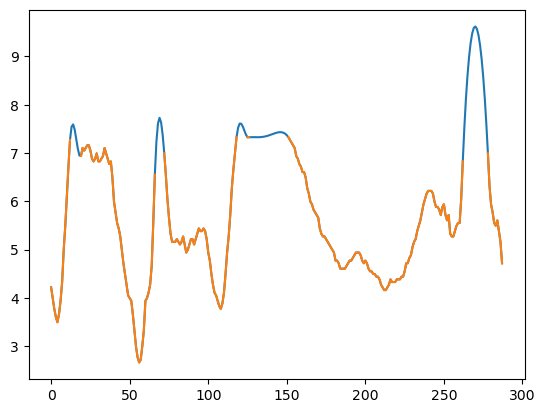

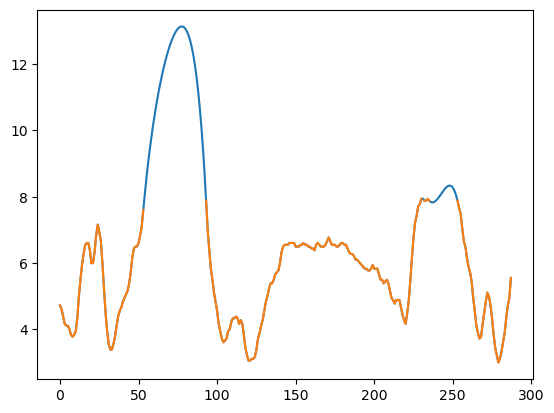

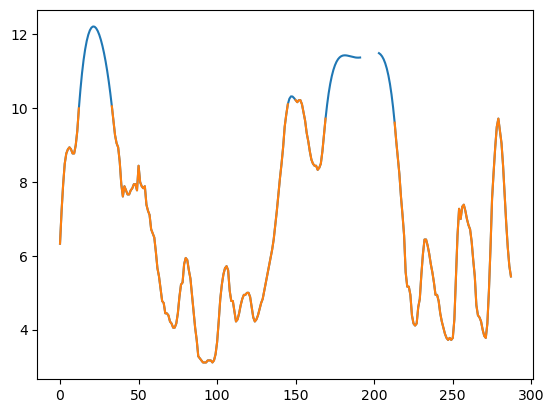

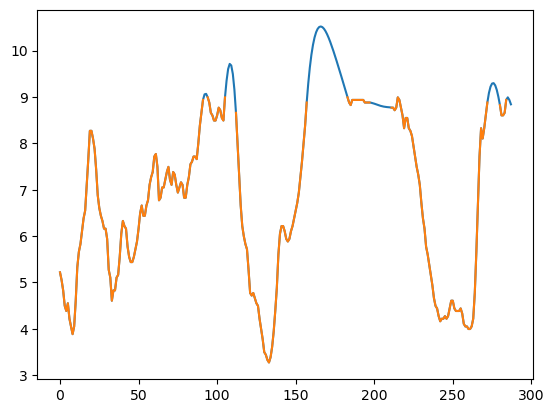

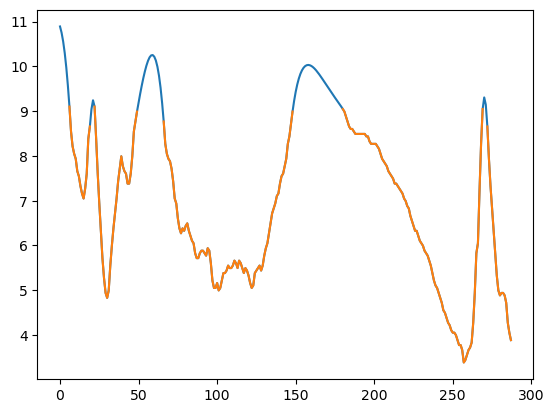

...

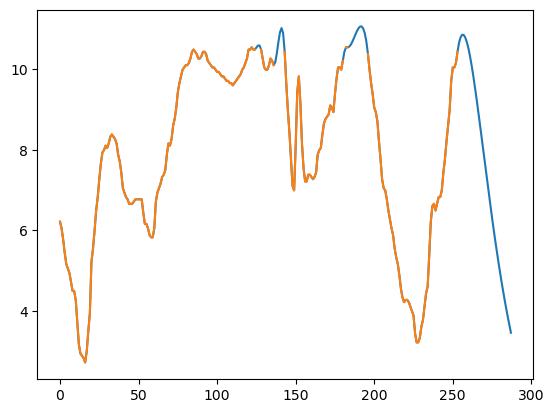

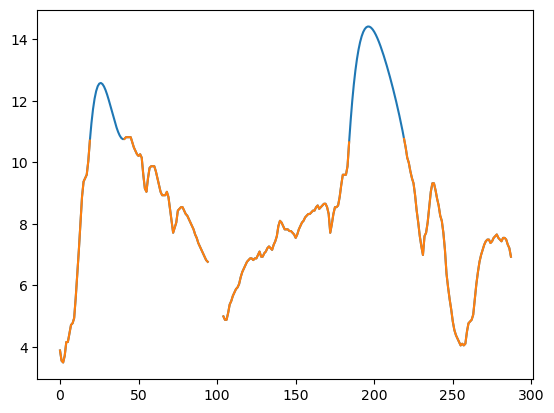

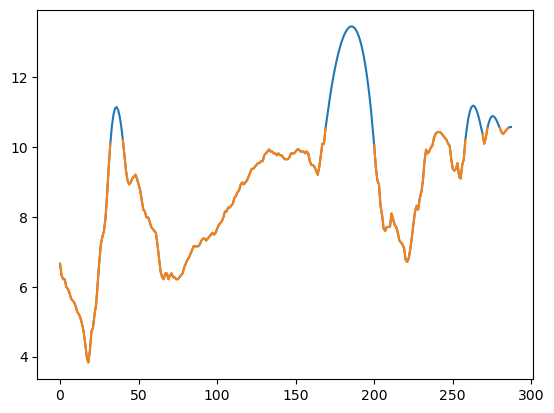

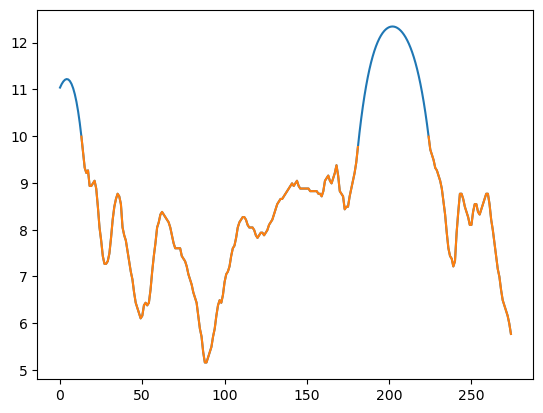

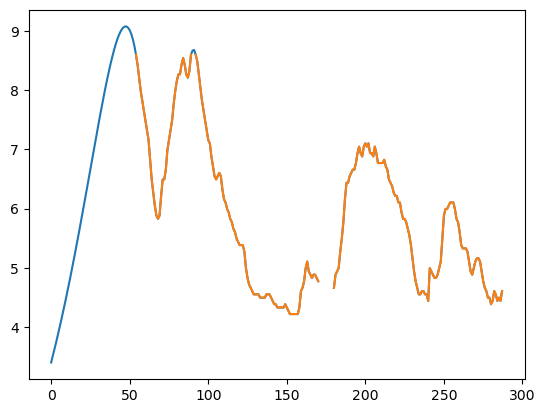

In [14]:
interpolated_segments_gp = {}
for patient_id, segments in censored_segments.items():
    interpolated_segments_gp[patient_id] = []
    for i in range(len(segments)):
        # Convert segment to DataFrame to use interpolation functions
        segment_df = pd.DataFrame(segments[i], columns=['cbg'])
        # Check if there are any NaN values in the segment
        if segment_df['cbg'].isna().any():
            ind_all = np.where(~np.isnan(np.array(segment_df)))[0]
            var = np.std(np.array(segment_df)[ind_all])**2
            # Only train and infer if there are NaN values
            gpr = train_gpr(np.array(segment_df), var=var)
            indices, interpolated_segment, std = inference_gpr(censored_segment_indices[patient_id][i][0], gpr)

            # Create a copy of the original segment and replace NaNs with interpolated values
            indices = indices.flatten()  # Ensure `indices` is a flat array
            full_interpolated_segment = np.array(segment_df).flatten().copy()
 
            full_interpolated_segment[indices] = np.array(interpolated_segment).flatten()  # Replace NaNs with interpolated values
            interpolated_segments_gp[patient_id].append(full_interpolated_segment)
            
            plt.figure()
            plt.plot(full_interpolated_segment)
            plt.plot(np.array(segment_df).flatten().copy())
  
        else:
            # If no NaN values, add the original segment without modification
            interpolated_segments_gp[patient_id].append(np.array(segment_df).flatten())
        

In [15]:
df_gp = compare_statistics(original_segments, censored_segments, interpolated_segments_gp)
display(df_gp)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-1.031902,-0.222476,1.082011,0.056893
1,SD,-0.806344,-0.251996,0.682968,0.070744
2,CV,-0.056618,-0.020297,0.003469,0.000479


In [16]:
def calculate_statistics(data_segments):
    """
    Calculate mean, standard deviation, and coefficient of variation for each segment.
    """
    stats = {}
    for patient_id, segments in data_segments.items():
        patient_segments = []
        for segment in segments:
            mean_glucose = np.nanmean(segment)
            std_glucose = np.nanstd(segment)
            cv_glucose = std_glucose / mean_glucose
            patient_segments.append({"Mean": mean_glucose, "SD": std_glucose, "CV": cv_glucose})
        
        stats[patient_id] = patient_segments
        
    return stats


def compare_statistics(bg_original, bg_before_imputation, bg_after_imputation):
    """
    Compare statistics for bias and MSE between original and imputed data.

    Args:
        bg_original: Dictionary of original glucose data (per patient).
        bg_before_imputation: Dictionary of glucose data before imputation (per patient).
        bg_after_imputation: Dictionary of glucose data after imputation (per patient).
        dataset: Name of the dataset for labeling purposes.

    Returns:
        DataFrame containing Bias and MSE before and after imputation for each metric.
    """
    # Calculate statistics
    statistic_original = calculate_statistics(bg_original)
    statistic_before_imputation = calculate_statistics(bg_before_imputation)
    statistic_after_imputation = calculate_statistics(bg_after_imputation)
    
    # print("statistic_original =", statistic_original)
    # print("statistic_before_imputation =", statistic_before_imputation)
    # print("statistic_after_imputation =", statistic_after_imputation)
    

    # Prepare results dictionary
    results = {
        "Metric": [],
        "Bias Before Imputation": [],
        "Bias After Imputation": [],
        "MSE Before Imputation": [],
        "MSE After Imputation": [],
    }

    # Metrics to compare
    metrics = ["Mean", "SD", "CV"]

    for metric in metrics:
            bias_before_values = []
            bias_after_values = []
            mse_before_values = []
            mse_after_values = []

            # Iterate over patients
            for patient_id in bg_original.keys():
                # Extract per-segment statistics for the current metric
                original_values = np.array([seg[metric] for seg in statistic_original[patient_id]])
                before_values = np.array([seg[metric] for seg in statistic_before_imputation[patient_id]])
                after_values = np.array([seg[metric] for seg in statistic_after_imputation[patient_id]])

                # Calculate per-patient biases and MSE
                bias_before_values.append(np.mean(before_values - original_values))
                bias_after_values.append(np.mean(after_values - original_values))
                mse_before_values.append(np.mean((before_values - original_values) ** 2))
                mse_after_values.append(np.mean((after_values - original_values) ** 2))

            # Calculate overall bias and MSE across all patients
            results["Metric"].append(metric)
            results["Bias Before Imputation"].append(np.mean(bias_before_values))
            results["Bias After Imputation"].append(np.mean(bias_after_values))
            results["MSE Before Imputation"].append(np.mean(mse_before_values))
            results["MSE After Imputation"].append(np.mean(mse_after_values))

    # Return results as DataFrame
    results_df = pd.DataFrame(results)

    return results_df

In [17]:
df_gp = compare_statistics(original_segments, censored_segments, interpolated_segments_gp)
display(df_gp)

,Metric,Bias Before Imputation,Bias After Imputation,MSE Before Imputation,MSE After Imputation
0,Mean,-1.032236,-0.223037,1.213293,0.194407
1,SD,-0.845343,-0.304553,0.967591,0.255553
2,CV,-0.066997,-0.028709,0.007013,0.002544
